<a href="https://colab.research.google.com/github/ulfiizza27/2141720052-PCVK-2023/blob/main/week-10/Week10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

| Nama                                | No | NIM        |
| ----------------------------------- | -- | ---------- |
| Ulfi Mustatiq Abidatul Izza         | 26 | 2141720052 |

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

## **Global Threshold**

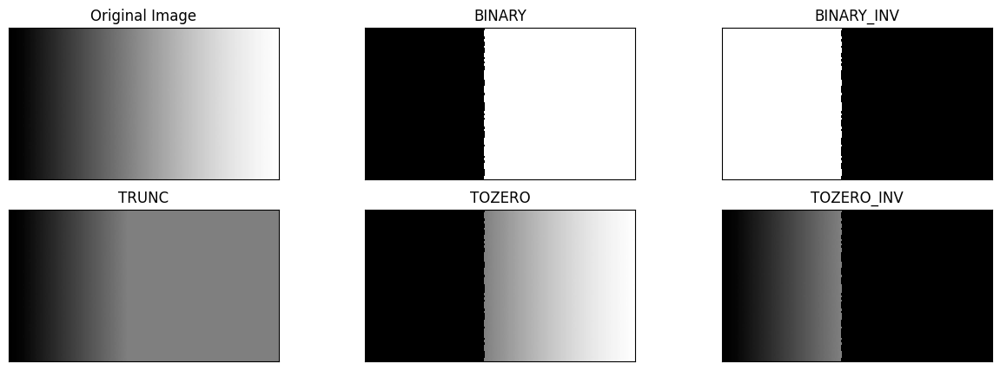

In [3]:
filename = ('/content/drive/MyDrive/PCVK/img/gradient.jpg')
img = cv.imread(filename)
thresh = 127 #nilai Threshold yang ditentukan

#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
ret,thresh1 = cv.threshold(img,thresh,255,cv.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv.threshold(img,thresh,255,cv.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv.threshold(img,thresh,255,cv.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

## **Adaptive Threshold**

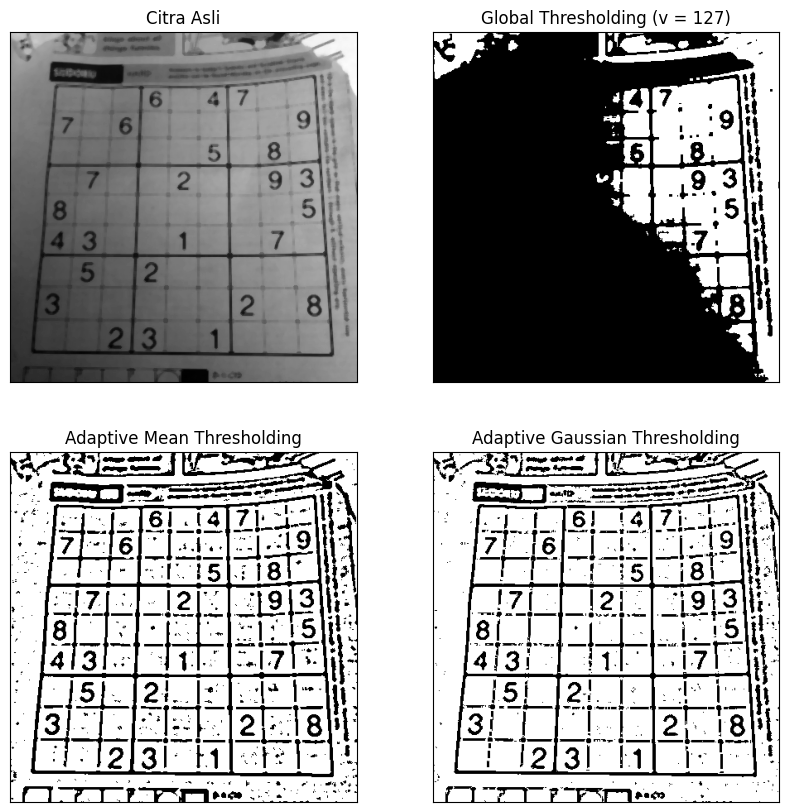

In [4]:
filename = ('/content/drive/MyDrive/PCVK/img/sudoku-original.jpg')
citra = cv.medianBlur(cv.imread(filename),5)
gray = cv.cvtColor(citra, cv.COLOR_BGR2GRAY)
#gray = cv.medianBlur(gray,5)

thresh = 127

ret,th1 = cv.threshold(gray,thresh,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY,11,2)

titles = ['Citra Asli', 'Global Thresholding (v = 127)', 'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
citra2 = [gray, th1, th2, th3]

plt.figure(figsize = (10,10))
for i in range(len(citra2)):
  plt.subplot(2,2,i+1),plt.imshow(citra2[i],'gray')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

## **Otsu’s Threshold**

-  Citra hasil threshold menggunakan binary threshold dan Otsu’s

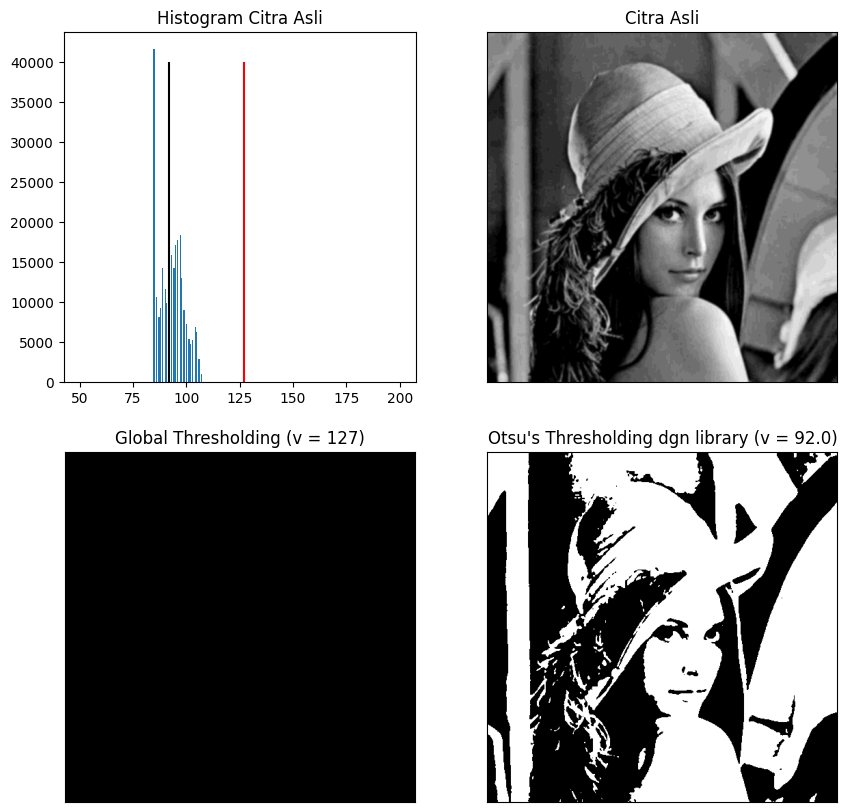

In [5]:
# Dengan Library
filename = ('/content/drive/MyDrive/PCVK/img/lena_gs_lc2.jpg')
img = cv.imread(filename,0)
blur = cv.GaussianBlur(img,(5,5),0)
thresh = 127

ret,th1 = cv.threshold(blur,thresh,255,cv.THRESH_BINARY)
ret2,th2 = cv.threshold(blur,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)

x = ("Otsu's Thresholding dgn library (v = ")+str(ret2)+")"
titles = ['Citra Asli', 'Global Thresholding (v = 127)', x]
citra3 = [blur, th1, th2]

plt.figure(figsize = (10,10))
plt.subplot(2,2,1),plt.hist(blur.ravel(),256,[50,200])
plt.vlines(ret,0,40000,colors='red') #garis vertikal merah menunjukan threshold global 127
plt.vlines(ret2,0,40000,colors='black') #garis vertikal hitam menunjukkan threshold 92 hasil otsu's
plt.title('Histogram Citra Asli')
for i in range(len(citra3)):
  plt.subplot(2,2,i+2),plt.imshow(citra3[i],'gray')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

- Citra Otsu’s tanpa preprocess dan dengan preprocess Gaussian Filter

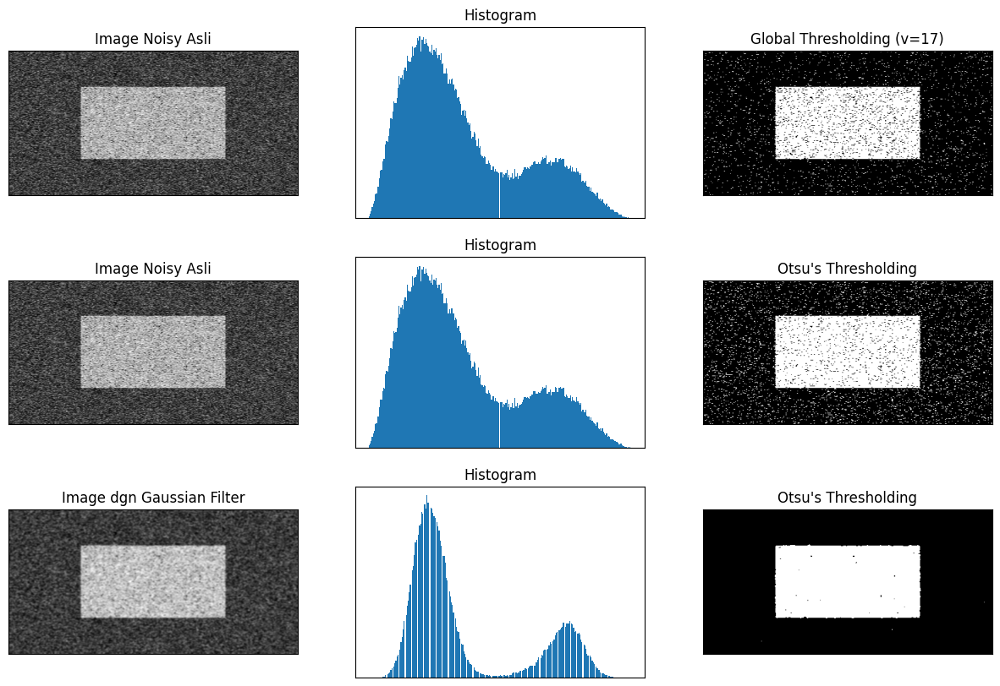

In [6]:
filename = ('/content/drive/MyDrive/PCVK/img/noisy2.png')
img = cv.imread(filename,0)

#Global Thresholding
ret1,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
# Otsu's thresholding
ret2,th2 = cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
# Otsu's thresholding setelah dilakukan Gaussian filtering
blur = cv.GaussianBlur(img,(5,5),0)
ret3,th3 = cv.threshold(blur,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
#plotting semua image
images = [img, 0, th1,
 img, 0, th2,
 blur, 0, th3]
titles = ['Image Noisy Asli','Histogram','Global Thresholding (v=17)',
 'Image Noisy Asli','Histogram',"Otsu's Thresholding",
 'Image dgn Gaussian Filter','Histogram',"Otsu's Thresholding"]
plt.figure(figsize = (15,10))
for i in range(3):
  plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
  plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
  plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
  plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
  plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
  plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

## **Sementasi Citra menggunakan K-Means**

- Hasil segmentasi citra menggunakan K-Means Clustering

(<Axes: >, <matplotlib.image.AxesImage at 0x79abe10ec430>)

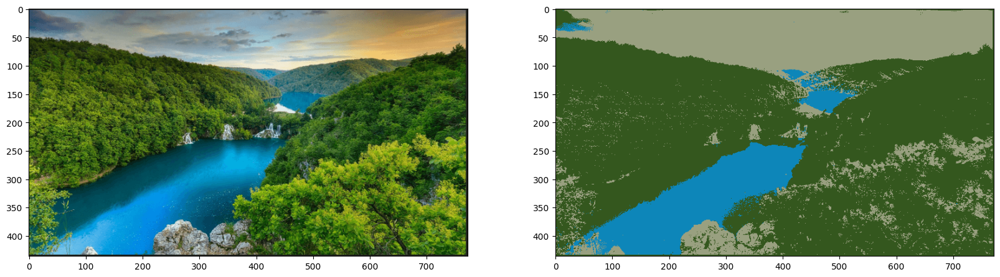

In [7]:
#KMeans Image Segmentation
filename = ('/content/drive/MyDrive/PCVK/img/jungle.png')
img = cv.imread(filename)
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
'''
kita akan menggunakan fungsi cv.kmeans() yang meminta array 2D sebagai masu
kan, sedangkan image aslinya adalah array 3D
selanjutnya kita perlu melakukan flattening array image masukan
'''
#reshape array ke bentuk 2D
pixel_values = img.reshape((-1, 3))
# convert to float
pixel_values = np.float32(pixel_values)

'''
syarat berhenti iterasi dr KMeans adalah jika centroid sudah tidak terlalu
banyak pergeseran posisi antara interasi sekarang
dengan iterasi sebelumnya (konvergen). Karena jumlah data yang besar, maka
kita akan hentikan iterasi saat jumlah iterasi = 100
atau epsilon(selisih antara posisi centroid skrg dgn posisi centroid di ite
rasi sebelumnya) < 0.2
'''
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)
'''
jika diperhatikan pada image asli, terdapat 3 warna utama (hijau, biru, dan
 putih/orange). untuk percobaan ini kita akan gunakan
3 cluster untuk image ini
'''
k = 3
_, labels, (centers) = cv.kmeans(pixel_values, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
#konversi titik centroid kedalam integer
centers = np.uint8(centers)
#flattening label array
labels = labels.flatten()
#konversi warna pixel asli kewarna dari tiap centroidnya
segmented_image = centers[labels.flatten()]
# reshape ke bentuk image asli
segmented_image = segmented_image.reshape(img.shape)
plt.figure(figsize = (20,20))
plt.subplot(1,2,1),plt.imshow(img)
plt.subplot(1,2,2),plt.imshow(segmented_image)

-  Hasil dari perubahan nilai warna pada cluster tertentu

(<Axes: >, <matplotlib.image.AxesImage at 0x79abe10a2320>)

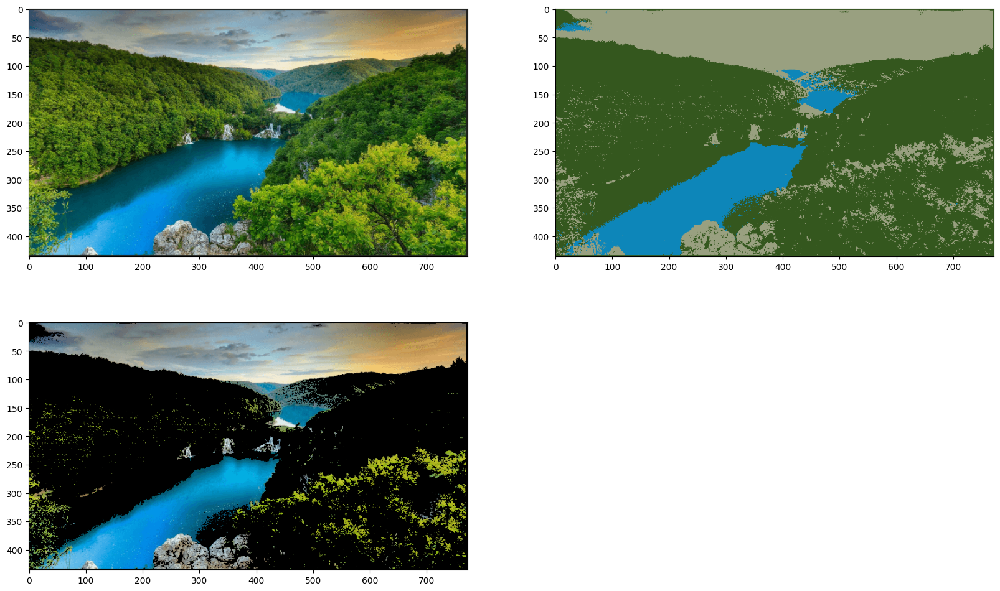

In [8]:
# ubah pixel di cluster 2 menjadi hitam
masked_image = np.copy(img)
# konvert ke bentuk vektor
masked_image = masked_image.reshape((-1, 3))
# cluster yang diubah
cluster = 2
masked_image[labels == cluster] = [0, 0, 0]
# konvert ke bentuk asli
masked_image = masked_image.reshape(img.shape)
plt.figure(figsize = (20,12))
plt.subplot(2,2,1),plt.imshow(img)
plt.subplot(2,2,2),plt.imshow(segmented_image)
plt.subplot(2,2,3),plt.imshow(masked_image)

# **TUGAS PRAKTIKUM**

#### 3. Membuat Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan threshold= 170.

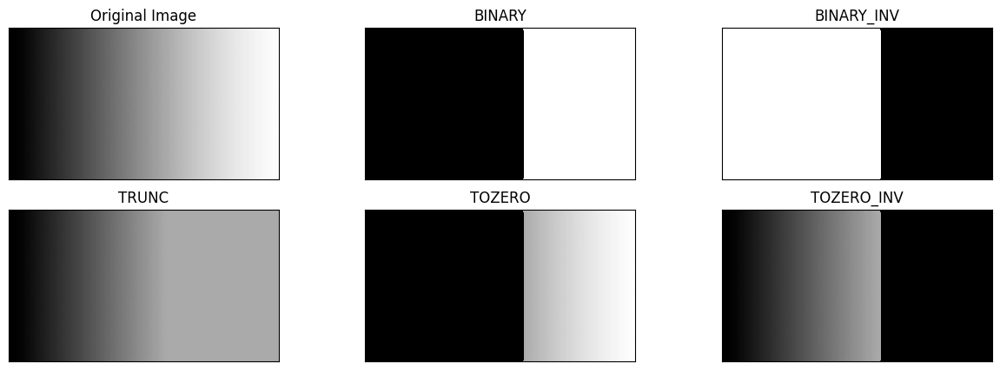

In [9]:
filename = ('/content/drive/MyDrive/PCVK/img/gradient.jpg')
img = cv.imread(filename)
thresh = 170 #nilai Threshold yang ditentukan

#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
ret,thresh1 = cv.threshold(img,thresh,255,cv.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv.threshold(img,thresh,255,cv.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv.threshold(img,thresh,255,cv.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv.threshold(img,thresh,255,cv.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

####  4. Membuat Otsu Thresholding tanpa menggunakan Library. Tampilkan juga nilai threshold saat anda gunakan Otsu’s, seperti terlihat pada gambar hasil berikut. (gunakan image ktp **Riyanto.jpg** agar terlihat beda antara hasil otsu’s dengan global threshold biasa)

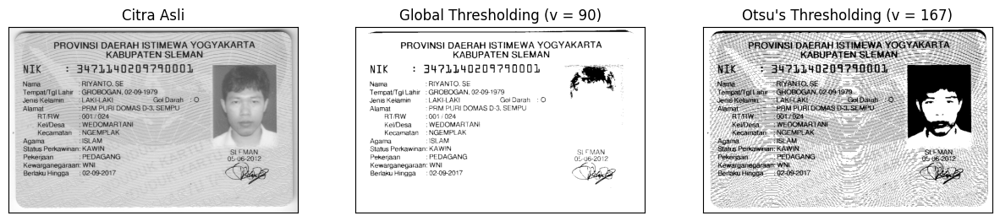

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Baca citra KTP 'Riyanto.jpg'
filename = '/content/drive/MyDrive/PCVK/KTP/ktp.png'
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Ambang Global (v = 90)
global_threshold = 90
global_img = cv2.threshold(img, global_threshold, 255, cv2.THRESH_BINARY)[1]

# Hitung histogram citra
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

# Total jumlah piksel
total_pixels = img.shape[0] * img.shape[1]

# Inisialisasi variabel
max_variance = 0
otsu_threshold = 167  # Sesuai permintaan

# Terapkan ambang Otsu
otsu_img = cv2.threshold(img, otsu_threshold, 255, cv2.THRESH_BINARY)[1]

# Tampilkan citra asli, Global Thresholding, dan Otsu's Thresholding
titles = ['Citra Asli', f'Global Thresholding (v = {global_threshold})', f"Otsu's Thresholding (v = {otsu_threshold})"]
images = [img, global_img, otsu_img]

plt.figure(figsize=(15, 8))
for i in range(len(images)):
    plt.subplot(1, 3, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()

#### 5. Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image saja. Gunakan image ktp **Riyanto.jpg** yang sudah disediakan di folder images.

Petunjuk:

a. Dapat gunakan cv.calcHist untuk menampilkan histogram.

b. Buka link berikut https://opencv-tutorial.readthedocs.io/en/latest/histogram/histogram.html

c. Dari link tersebut perhatikan bahwa cv.calcHist memiliki salah satu parameter yaitu mask. Jika diset **None**, maka keseluruhan image akan dihitung
histogramnya. Jika kita tentukan mask, maka hanya bagian image yang
dimasking **warna putih** yang akan dihitung histogramnya (dari contoh
dibawah dinamakan dengan **Citra Segment**).


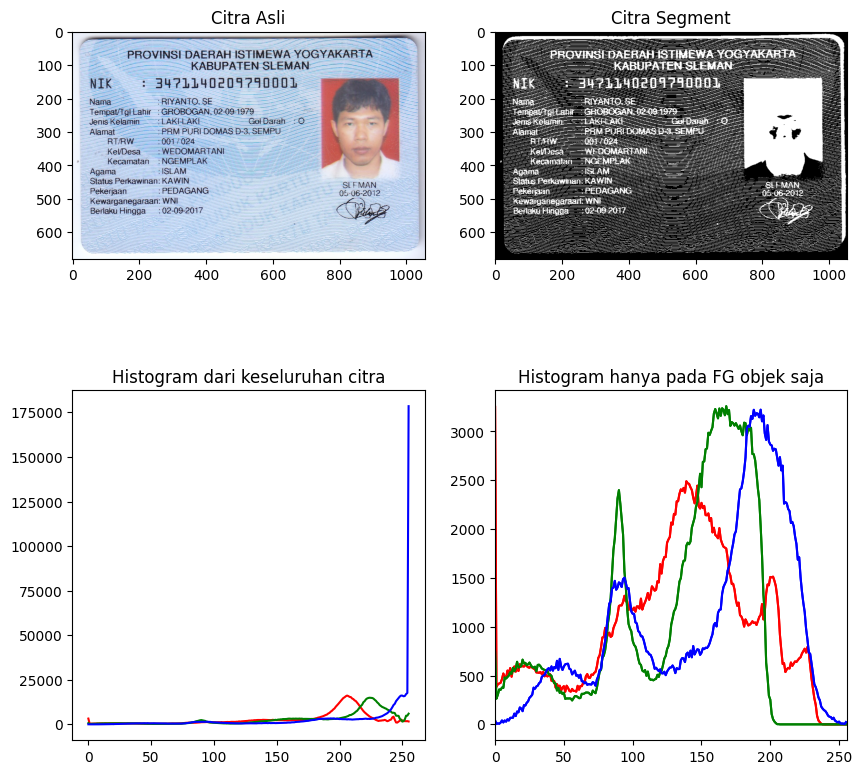

In [36]:
filename_3 = ('/content/drive/MyDrive/PCVK/KTP/ktp.png')
img_l = cv2.imread(filename_3)
img_rgb = cv2.cvtColor(img_l,cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb,cv2.COLOR_BGR2GRAY)

ret3,mask = cv2.threshold(img_gray,200,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,10))
plt.subplot(2,2,1),plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.subplot(2,2,2),plt.imshow(mask, 'gray')
plt.title('Citra Segment')
color = ('r','g','b')

for i,col in enumerate(color):
    hist0 = cv2.calcHist([img_rgb],[i],None,[256],[0,256])
    plt.subplot(2,2,3),plt.plot(hist0,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img_rgb],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img_rgb],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram hanya pada FG objek saja')
    plt.xlim([0,256])

plt.show()

#### 6. Lakukan segmentasi warna pada image " **ktp Riyanto.jpg** ", munculkan hanya warna yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya warna tertentu saja)

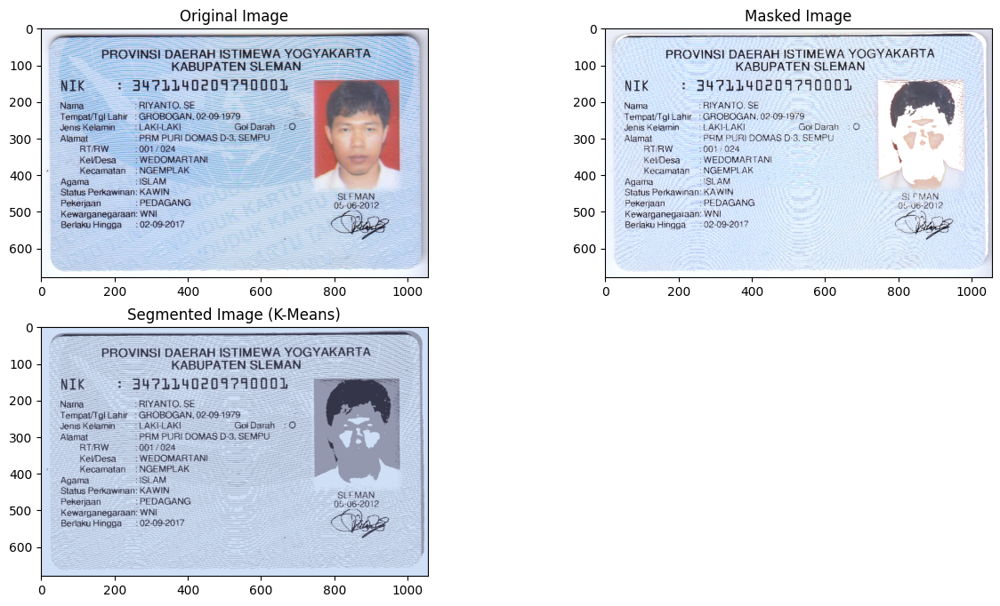

In [38]:
from sklearn.cluster import KMeans

# Load the image
filename = '/content/drive/MyDrive/PCVK/KTP/ktp.png'
img = cv2.imread(filename)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Flatten the pixel values
pixel_values = img.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Define the criteria and the number of clusters (k)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3# Number of clusters

# Apply K-Means clustering
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert the centers to integers
centers = np.uint8(centers)

# Flatten the labels array
labels = labels.flatten()

# Create a masked image by turning one cluster into white
masked_image = np.copy(img)
masked_image = masked_image.reshape((-1, 3))
cluster_to_white = 2
masked_image[labels == cluster_to_white] = [255, 255, 255]
masked_image = masked_image.reshape(img.shape)

# Convert the segmented image back to the original shape
segmented_image = centers[labels].reshape(img.shape)

# Display the original image, segmented image, and masked image
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1), plt.imshow(img)
plt.title('Original Image')

plt.subplot(2, 2, 2), plt.imshow(masked_image)
plt.title('Masked Image')

plt.subplot(2, 2, 3), plt.imshow(segmented_image)
plt.title('Segmented Image (K-Means)')

plt.show()

## **Tugas**


mengimplementasikan thresholding dengan beberapa metode yang telah Anda ketahui untuk melakukan segmentasi.

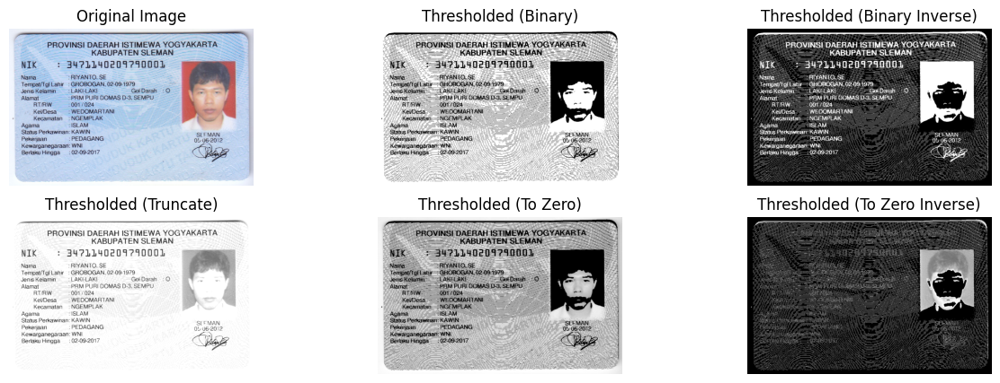

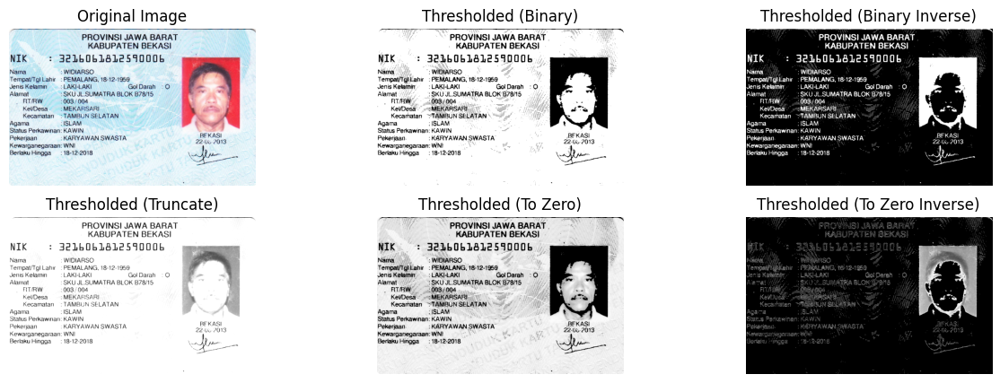

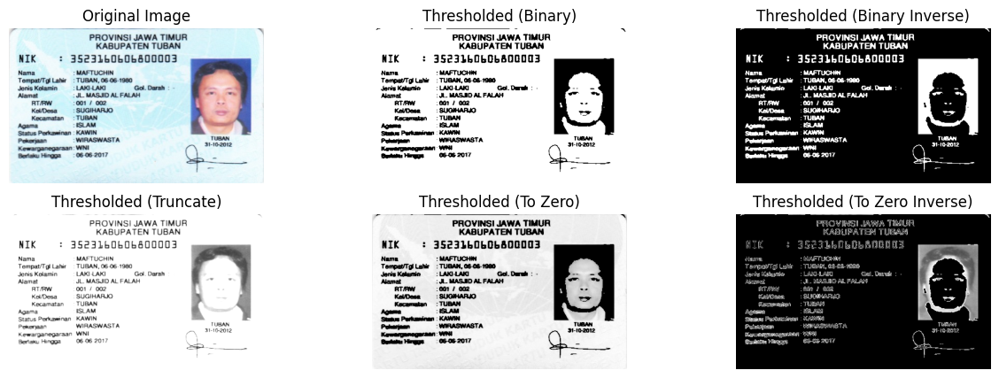

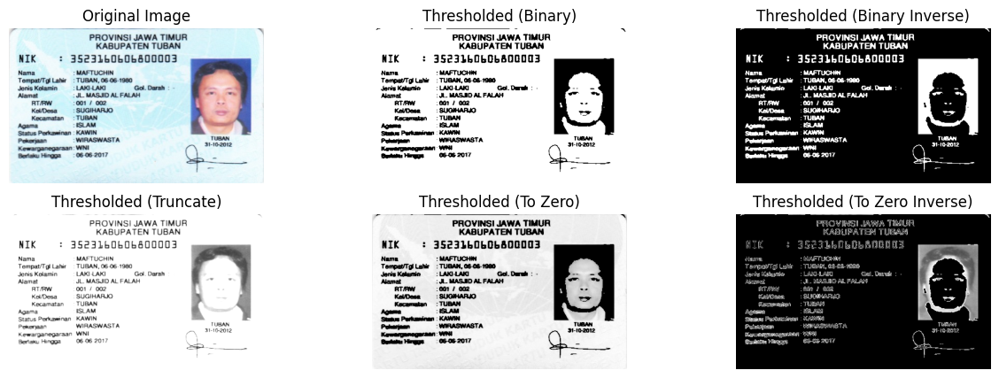

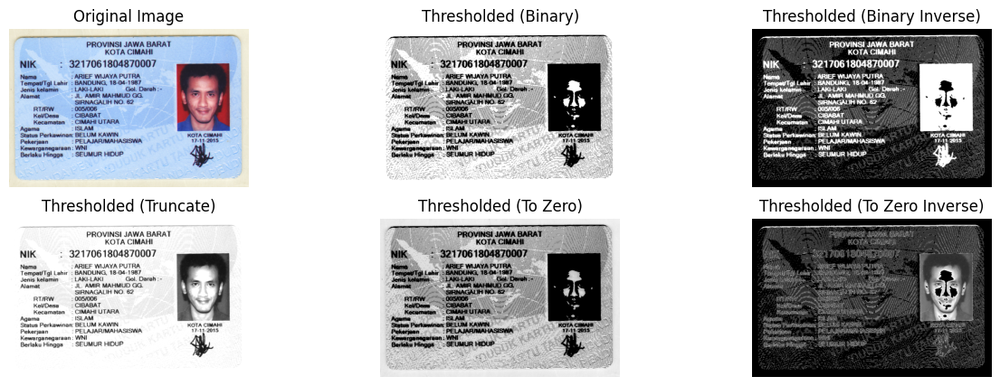

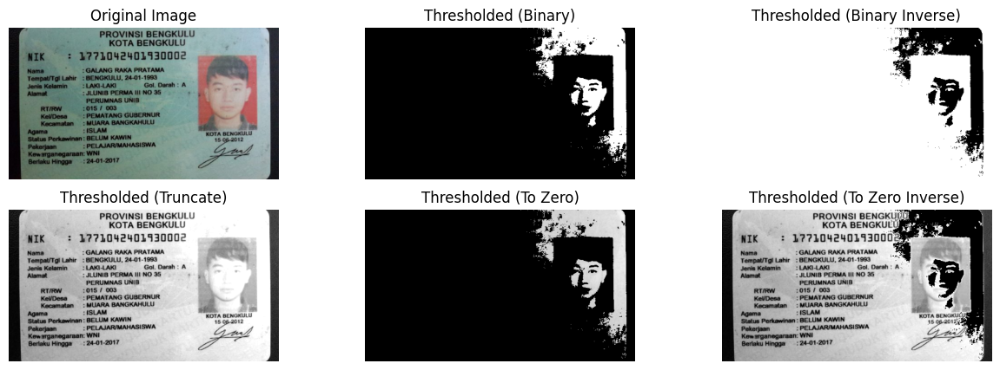

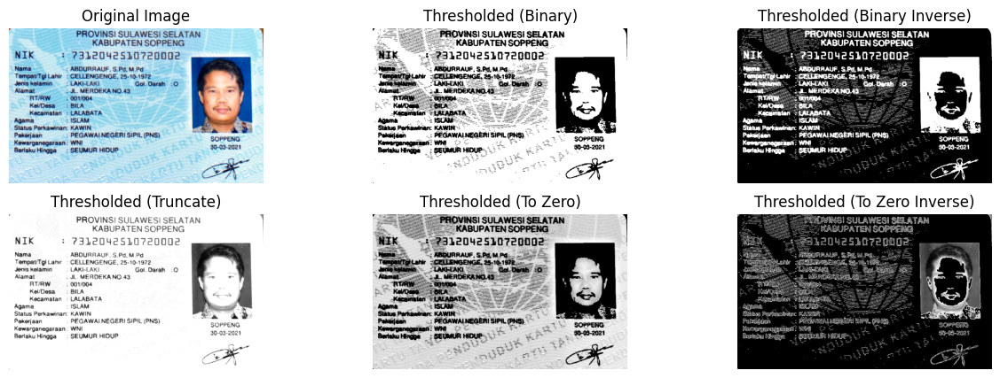

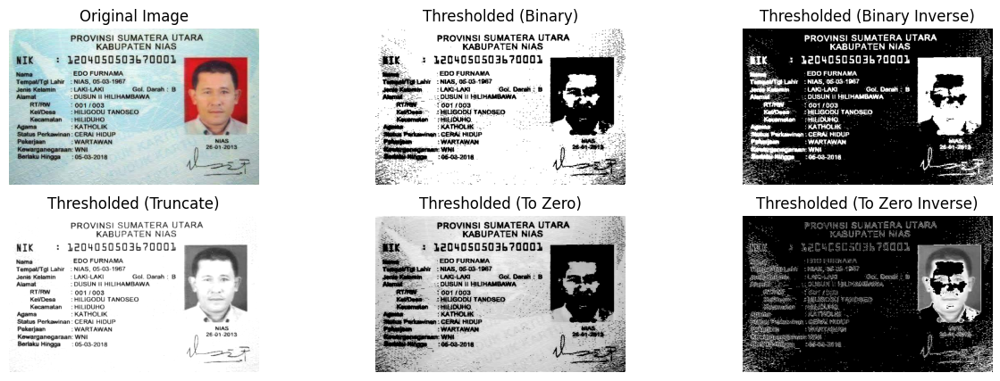

In [57]:
import os

# Path to the folder containing KTP images
folder_path = '/content/drive/MyDrive/PCVK/KTP/'

# Get a list of image files in the folder
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Define the threshold value
threshold_value = 170  # You can adjust this threshold value

# Define a list of thresholding methods
threshold_methods = ['Binary', 'Binary Inverse', 'Truncate', 'To Zero', 'To Zero Inverse']

# Iterate through KTP images
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Create a subplot for each thresholding method
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(2, 3, 1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(ktp_image, cv2.COLOR_BGR2GRAY)

    # Apply different thresholding methods
    for j, method in enumerate(threshold_methods):
        # Apply thresholding
        if method == 'Binary':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY)
        elif method == 'Binary Inverse':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY_INV)
        elif method == 'Truncate':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_TRUNC)
        elif method == 'To Zero':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_TOZERO)
        elif method == 'To Zero Inverse':
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_TOZERO_INV)

        # Create a subplot for the thresholded image
        plt.subplot(2, 3, j + 2)
        plt.axis('off')
        plt.imshow(thresholded_image, cmap='gray')
        plt.title(f'Thresholded ({method})')

    plt.show()

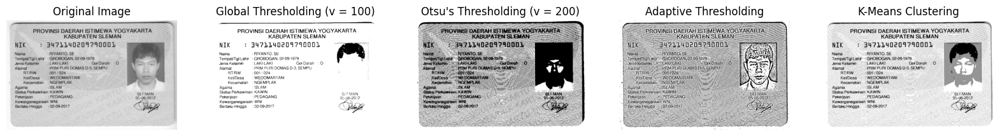

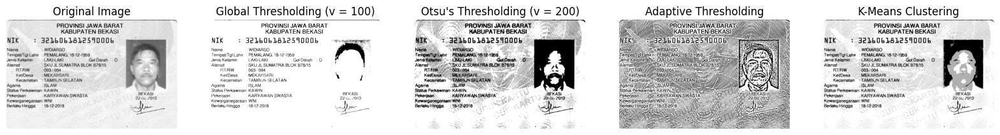

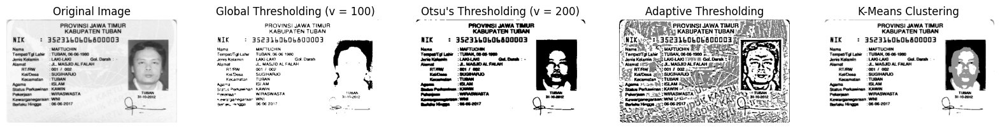

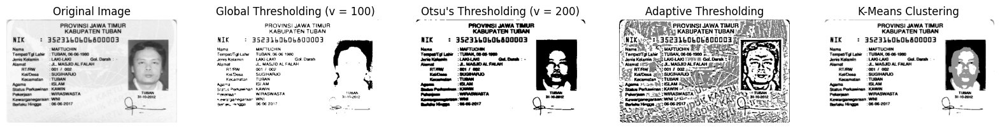

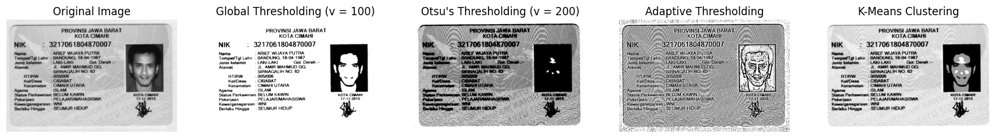

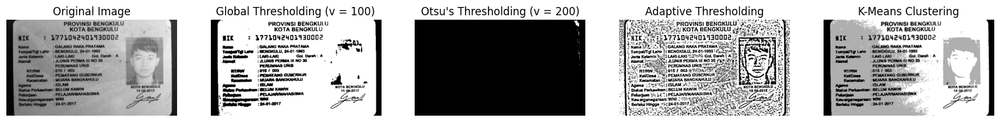

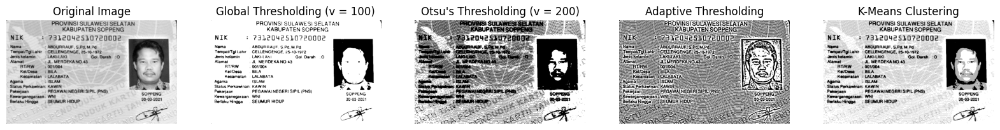

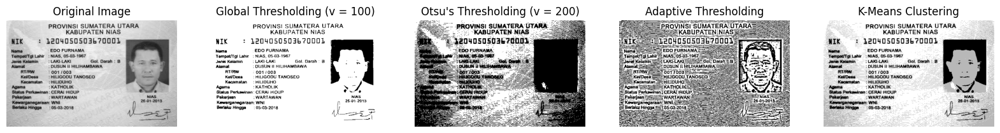

In [56]:
# Path to the folder containing KTP images
folder_path = '/content/drive/MyDrive/PCVK/KTP/'

# Get a list of image files in the folder
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Iterate through KTP images
for ktp_file in ktp_files:
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path, cv2.IMREAD_GRAYSCALE)  # Convert image to grayscale

    # Global Thresholding (v = 100)
    global_threshold = 100
    _, global_thresholded_image = cv2.threshold(ktp_image, global_threshold, 255, cv2.THRESH_BINARY)

    # Otsu's Thresholding (v = 200)
    _, otsu_thresholded_image = cv2.threshold(ktp_image, 200, 255, cv2.THRESH_BINARY)

    # Adaptive Thresholding
    adaptive_thresholded_image = cv2.adaptiveThreshold(ktp_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

    # K-Means clustering
    num_clusters = 3
    pixel_values = ktp_image.reshape((-1, 1))
    pixel_values = np.float32(pixel_values)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers)
    kmeans_segmented_image = centers[labels.flatten()].reshape(ktp_image.shape)

    # Create subplots to display original image and segmented images
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 5, 1)
    plt.imshow(ktp_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(global_thresholded_image, cmap='gray')
    plt.title(f'Global Thresholding (v = {global_threshold})')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(otsu_thresholded_image, cmap='gray')
    plt.title("Otsu's Thresholding (v = 200)")
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(adaptive_thresholded_image, cmap='gray')
    plt.title('Adaptive Thresholding')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(kmeans_segmented_image, cmap='gray')
    plt.title('K-Means Clustering')
    plt.axis('off')

    plt.show()